# GUC NETW 1003 Kmeans Assginmnet 

Objective: exercise is to learn how to use build and use  kmeans clustering algortrithm    

At the end of this lab you will be able to
> 1. Build and run a K-means algorithm.
> 2. Know how to evalute K-means Algorithm 
> 2. Understand the effect of the parmeters ont he perfromance of the algorithm .
> 3. Understand the effect of distance.

## 1. Wirte K means function 

In [4]:
# def GUC_Distance(Cluster_Centroids, Data_points, Distance_Type):
#     # We get the  number of data points by getting the size of the first dimension of the Data_points array.
#     #The shape of Data_points is assumed to be (number_of_data_points, number_of_features).
#     num_data_points = Data_points.shape[0]
    
#     #We get the number of clusters by getting the size of the first dimension of the Cluster_Centroids array.
#     # The shape of Cluster_Centroids is assumed to be (number_of_clusters, number_of_features).
#     num_clusters = Cluster_Centroids.shape[0]
    
#     # Expand dimensions for the need for explicit reshaping or replication of the smaller array.
#     expanded_data_points = np.expand_dims(Data_points, axis=1)
#     expanded_cluster_centroids = np.expand_dims(Cluster_Centroids, axis=0)

#     if Distance_Type == 'euclidean':
#         # Euclidean distance
#         distances =np.linalg.norm(Data_points[:, np.newaxis, :] - Cluster_Centroids, axis=2)

#     elif Distance_Type == 'pearson':
#         # Pearson correlation distance
#         centered_data = Data_points - np.mean(Data_points, axis=0)
#         centered_centroids = Cluster_Centroids - np.mean(Cluster_Centroids, axis=0)

#         numerator = np.dot(centered_data, centered_centroids.T)
#         denominator = np.sqrt(np.sum(centered_data ** 2, axis=1)[:, np.newaxis] * np.sum(centered_centroids ** 2, axis=1))

#         distances = 1 - (numerator / denominator)

#     else:
#         raise ValueError("Invalid Distance_Type. Choose 'euclidean' or 'pearson'.")


#     return distances




# def GUC_Kmean(Data_points, Number_of_Clusters, Distance_Type, max_iter=10000,tol=1e-6, consecutive_iterations_tol=2):
    
#     num_points, num_features = Data_points.shape
    
#     Cluster_Centroids = np.random.rand(Number_of_Clusters, num_features) * np.max(Data_points, axis=0)
    
#     print ("\nCluster_Centroids:")
#     print (Cluster_Centroids)

#     prev_mean_square_distances = np.zeros(Number_of_Clusters)
    
#     for iteration in range(max_iter):
#         # 1. Cluster Assignment
#         distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type)
#         cluster_assignments = np.argmin(distances, axis=1)

#         # Calculate mean square distance for each cluster
#         mean_square_distances = np.array([np.mean(distances[cluster_assignments == k, k]) for k in range(Number_of_Clusters)])
        
#         # Stopping conditions
#         if iteration > 0 and np.all(np.abs(mean_square_distances - prev_mean_square_distances) < tol):
#             print(f"\nStopping condition 1 met: Mean square distances have not changed significantly for {consecutive_iterations_tol} consecutive iterations.")
#             break
        
#         if np.sum(mean_square_distances) < tol:
#             print("\nStopping condition 2 met: Sum of mean square distances is less than the tolerance.")
#             break
        
#         prev_mean_square_distances = mean_square_distances.copy()
        
#         # 2. Update Centroids
#         for k in range(Number_of_Clusters):
#             cluster_points = Data_points[cluster_assignments == k, :]
#             if cluster_points.shape[0] > 0:
#                 Cluster_Centroids[k, :] = np.mean(cluster_points, axis=0)
#             else:
#                 # If the cluster is empty, keep the centroid unchanged or reinitialize it
#                 Cluster_Centroids[k, :] = np.random.rand(num_features) * np.max(Data_points, axis=0)

        
#     # Calculate final cluster distances and cluster metric (Distortion Function)
#     final_cluster_distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type)
#     cluster_metric = np.sum(mean_square_distances)
    
#     return final_cluster_distances, cluster_metric


# def display_cluster(data_points, km=None, num_clusters=None, alpha=0.7, s=50):
#     color = plt.cm.rainbow(np.linspace(0, 1, num_clusters))
#     vars = len(data_points[0])
#     fig, axs = plt.subplots(vars,vars,figsize=(25, 25))
#     if km is not None:S
#         for i in range(num_clusters):
#             cluster_points = data_points[km == i, :]
#             for j in range(0,len(cluster_points[0])):
#                 for k in range (0,len(cluster_points[0])):
#                     cluster_points = data_points[km == i, :]
#                     axs[j,k].scatter(cluster_points[:, j], cluster_points[:, k], c=[color[i]], alpha=alpha, s=s, label=f'Cluster {i}')
#                     axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')
#     else:
#         plt.scatter(data_points[:, 0], data_points[:, 1], c='b', alpha=alpha, s=s, label='Data Points')

#     plt.title('K-means Clustering Result')
#     plt.xlabel('Feature 1')
#     plt.ylabel('Feature 2')
#     plt.legend()
#     plt.show()

    

import required libraries 

In [5]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.datasets import make_moons

> ### 1.1. Code for the distance function 

write a function to calculate the distance between a set of cluster centroids and all the data points 

Cluster_Distances = GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type) 
* The function shoud be able to handel data points with any number of features and any number of points 
* The function should be able to handle any K number of cluster centroids 
* To inrease speed do that in matrix format using numpy
* This should produce a matrix with rows equal to data points columns equal K 
* You should be able to calculate different types of Distance. In this assginmnet you are required to implement the following two 
    - Ecluidian distance
    - Pearson correlation distance
  

In [6]:
def GUC_Distance(Cluster_Centroids, Data_points, Distance_Type):
    # We get the  number of data points by getting the size of the first dimension of the Data_points array.
    #The shape of Data_points is assumed to be (number_of_data_points, number_of_features).
    num_data_points = Data_points.shape[0]
    
    #We get the number of clusters by getting the size of the first dimension of the Cluster_Centroids array.
    # The shape of Cluster_Centroids is assumed to be (number_of_clusters, number_of_features).
    num_clusters = Cluster_Centroids.shape[0]
    
    # Expand dimensions for the need for explicit reshaping or replication of the smaller array.
    expanded_data_points = np.expand_dims(Data_points, axis=1)
    expanded_cluster_centroids = np.expand_dims(Cluster_Centroids, axis=0)

    if Distance_Type == 'euclidean':
        # Euclidean distance
        distances =np.linalg.norm(Data_points[:, np.newaxis, :] - Cluster_Centroids, axis=2)

    elif Distance_Type == 'pearson':
        # Pearson correlation distance
        centered_data = Data_points - np.mean(Data_points, axis=0)
        centered_centroids = Cluster_Centroids - np.mean(Cluster_Centroids, axis=0)

        numerator = np.dot(centered_data, centered_centroids.T)
        denominator = np.sqrt(np.sum(centered_data ** 2, axis=1)[:, np.newaxis] * np.sum(centered_centroids ** 2, axis=1))

        distances = 1 - (numerator / denominator)

    else:
        raise ValueError("Invalid Distance_Type. Choose 'euclidean' or 'pearson'.")


    return distances

> ### 1.2. Code for K means function 

Create the intial cluster heads 
 1. For each data colom find the data ranges 
 2. randomly generate a number of cluster heads equal to K (th number of clusters)

> Loop until a stopping condition 

> > in the loop do the following 
> > 1. Cluster Assginmnet 
> > > * Use the GUC_Distance to calculate between each cluster head and all the points 
> > > * Find the value and index of the minimum distance  for each row. 
> > > * for each point in the row use the index of the minmum distance to represent the cluster Centroid that this point will belong to.
> > > * Calculate and record the mean square distance for each cluster  
> > > * Use the mean square distances to calculate a stopping condition (e.g the sum of mean distances)
> > 2. Updtate Centroids  
> > > * Update the value for the cluster heads by calculating the mean value for the points in each cluster 
> > >  * Calculate the Cluster Metric (Distortion Function)
> > > > a number indicating the how good the clusters are . An example cluster metric is the  (sum of squared error between each point and its cluster center) 

In [7]:
# def GUC_Kmean(Data_points, Number_of_Clusters, Distance_Type, max_iter=10000,tol=1e-6, consecutive_iterations_tol=2):
    
#     num_points, num_features = Data_points.shape
    
#     Cluster_Centroids = np.random.rand(Number_of_Clusters, num_features) * np.max(Data_points, axis=0)
    
#     print ("\nCluster_Centroids:")
#     print (Cluster_Centroids)

#     prev_mean_square_distances = np.zeros(Number_of_Clusters)
    
#     for iteration in range(max_iter):
#         # 1. Cluster Assignment
#         distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type)
#         cluster_assignments = np.argmin(distances, axis=1)

#         # Calculate mean square distance for each cluster
#         mean_square_distances = np.array([np.mean(distances[cluster_assignments == k, k]) for k in range(Number_of_Clusters)])
        
#         # Stopping conditions
#         if iteration > 0 and np.all(np.abs(mean_square_distances - prev_mean_square_distances) < tol):
#             print(f"\nStopping condition 1 met: Mean square distances have not changed significantly for {consecutive_iterations_tol} consecutive iterations.")
#             break
        
#         if np.sum(mean_square_distances) < tol:
#             print("\nStopping condition 2 met: Sum of mean square distances is less than the tolerance.")
#             break
        
#         prev_mean_square_distances = mean_square_distances.copy()
        
#         # 2. Update Centroids
#         for k in range(Number_of_Clusters):
#             cluster_points = Data_points[cluster_assignments == k, :]
#             if cluster_points.shape[0] > 0:
#                 Cluster_Centroids[k, :] = np.mean(cluster_points, axis=0)
#             else:
#                 # If the cluster is empty, keep the centroid unchanged or reinitialize it
#                 Cluster_Centroids[k, :] = np.random.rand(num_features) * np.max(Data_points, axis=0)

        
#     # Calculate final cluster distances and cluster metric (Distortion Function)
#     final_cluster_distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type)
#     cluster_metric = np.sum(mean_square_distances)
    
#     return final_cluster_distances, cluster_metric


In [9]:
def GUC_Kmean(Data_points, Number_of_Clusters, Distance_Type, tol=1e-6, consecutive_iterations_tol=2):
    num_points, num_features = Data_points.shape
    
    Cluster_Centroids = np.random.rand(Number_of_Clusters, num_features) * np.max(Data_points, axis=0)
    
    print("\nCluster_Centroids:")
    print(Cluster_Centroids)

    prev_mean_square_distances = np.zeros(Number_of_Clusters)
    
    iteration = 0
    
    while True:
        # 1. Cluster Assignment
        distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type)
        cluster_assignments = np.argmin(distances, axis=1)

        # Calculate mean square distance for each cluster
        mean_square_distances = np.array([np.mean(distances[cluster_assignments == k, k]) for k in range(Number_of_Clusters)])
        
        # Stopping conditions
        if iteration > 0 and np.all(np.abs(mean_square_distances - prev_mean_square_distances) < tol):
            print(f"\nStopping condition 1 met: Mean square distances have not changed significantly for {consecutive_iterations_tol} consecutive iterations.")
            break
        
        if np.sum(mean_square_distances) < tol:
            print("\nStopping condition 2 met: Sum of mean square distances is less than the tolerance.")
            break
        
        prev_mean_square_distances = mean_square_distances.copy()
        
        # 2. Update Centroids
        for k in range(Number_of_Clusters):
            cluster_points = Data_points[cluster_assignments == k, :]
            if cluster_points.shape[0] > 0:
                Cluster_Centroids[k, :] = np.mean(cluster_points, axis=0)
            else:
                # If the cluster is empty, keep the centroid unchanged or reinitialize it
                Cluster_Centroids[k, :] = np.random.rand(num_features) * np.max(Data_points, axis=0)
        
        iteration += 1

    # Calculate final cluster distances and cluster metric (Distortion Function)
    final_cluster_distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type)
    cluster_metric = np.sum(mean_square_distances)
    
    return final_cluster_distances, cluster_metric



Data Points:
[[5 9]
 [4 5]
 [7 1]
 [8 3]
 [5 2]
 [4 2]
 [2 8]
 [4 8]
 [5 6]
 [0 9]
 [8 2]
 [3 6]
 [7 0]
 [0 3]
 [3 5]
 [6 6]
 [3 8]
 [9 6]
 [5 1]
 [6 1]]


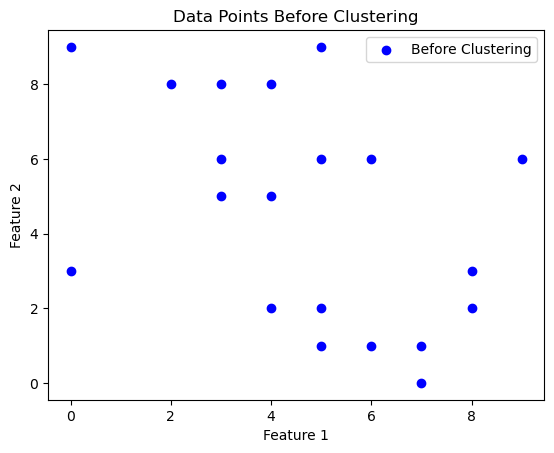


Cluster_Centroids:
[[4.8040679  3.91012732]
 [1.6847331  2.59448382]
 [5.64450598 3.20135284]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


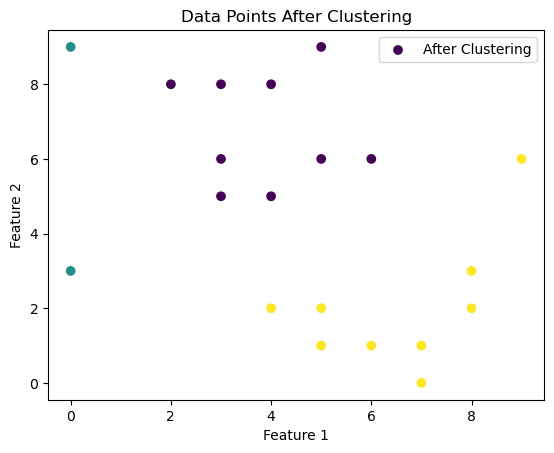

Final Cluster Distances:
[[2.48451997 5.83095189 7.1707568 ]
 [1.78124662 4.12310563 3.94092174]
 [6.56214358 8.60232527 1.09431753]
 [5.58326423 8.54400375 1.75682092]
 [4.90527557 6.40312424 1.55555556]
 [4.77906959 5.65685425 2.55555556]
 [2.24982853 2.82842712 7.53346444]
 [1.22726234 4.47213595 6.52156915]
 [1.35628396 5.         4.29182398]
 [4.47903208 3.         9.59037583]
 [6.30304649 8.94427191 1.44444444]
 [1.18112731 3.         5.35181981]
 [7.45769964 9.21954446 2.04878766]
 [5.42172129 3.         6.63138814]
 [1.98761598 3.16227766 4.65209365]
 [2.24982853 6.         4.03839597]
 [1.5112745  3.60555128 6.97437992]
 [5.16995117 9.         4.68778291]
 [5.88364546 7.07106781 1.84925744]
 [6.15138246 7.81024968 1.1439589 ]]

Cluster Metric (Distortion Function): 6.796163184057578


In [10]:
### QUICK TEST ###

# Generate random data points
np.random.seed(456)
data_points = np.random.randint(low=0 ,high= 10,size= (20, 2))  # 100 points in 2D space
print("\nData Points:")
print (data_points)
# Number of clusters
num_clusters = 3

# Distance type ('euclidean' or 'pearson')
distance_type = 'euclidean'

# Plot data points before clustering
plt.scatter(data_points[:, 0], data_points[:, 1], color='blue', label='Before Clustering')
plt.title('Data Points Before Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

# Run K-means clustering
final_cluster_distances, cluster_metric = GUC_Kmean(data_points, num_clusters, distance_type)

# Extract cluster assignments from final distances
cluster_assignments = np.argmin(final_cluster_distances, axis=1)

# Plot data points after clustering
plt.scatter(data_points[:, 0], data_points[:, 1], c=cluster_assignments, cmap='viridis', label='After Clustering')
plt.title('Data Points After Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

# # Plot data points after clustering
# plt.scatter(data_points[:, 0], data_points[:, 1], c=cluster_assignments, cmap='viridis', label='After Clustering')
# plt.scatter(Cluster_Centroids[:, 0], Cluster_Centroids[:, 1], c='red', marker='X', label='Final Cluster Centroids')
# plt.title('Data Points After Clustering')
# plt.xlabel('Feature 1')
# plt.ylabel('Feature 2')
# plt.legend()
# plt.show()


print(f'Final Cluster Distances:\n{final_cluster_distances}\n')
print(f'Cluster Metric (Distortion Function): {cluster_metric}')


## 2. Display Results 

* below is a an example fuction that displayes Clusters in 2D 

* You need to change the function so that is can display an n dimension data in the form of pairs of subplot 2D figures 

* The function is a helper function that is originaly be found in 
https://www.coursera.org/learn/ibm-unsupervised-learning/


In [11]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

> #### 2.1. helper Display function 

In [20]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(np.mean(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100))

> #### 2.2. Example 1 : Circular Data Gen and display 

* below is an example of how to use the funciton 
  *  prepare the figure size and background 
   > * this part can be replaced by a number of subplots 
  
  * Produce a data set that represent the x and y o coordinates of a circle 
   > * this part can be replaced by data that you import froma file 
  
  * Data is displayed 
   > * to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 

In [21]:
# prepare the figure sise and background 
# this part can be replaced by a number of subplots 
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

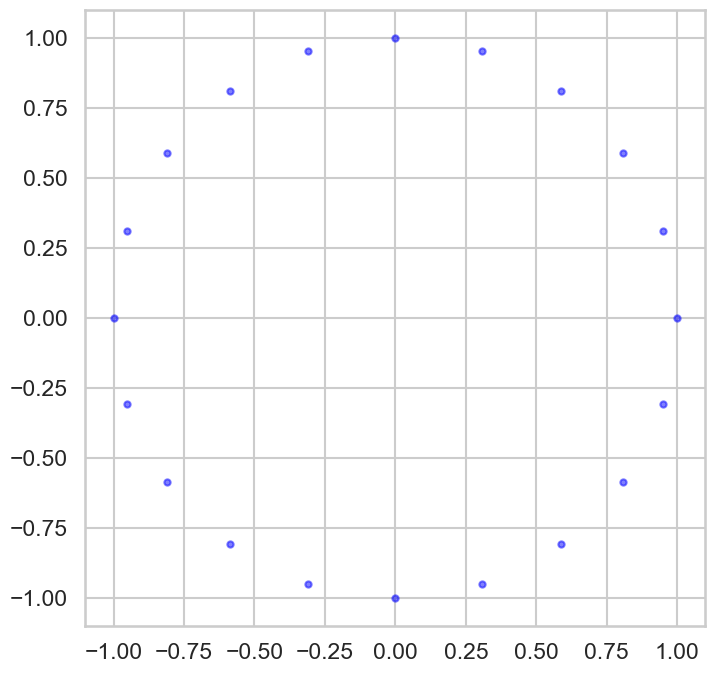

In [22]:

# Produce a data set that represent the x and y o coordinates of a circle 
# this part can be replaced by data that you import froma file 
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
# Data is displayed 
# to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 
display_cluster(X)

> #### 2.3. Example 2 : Multi blob Data Gen and display 

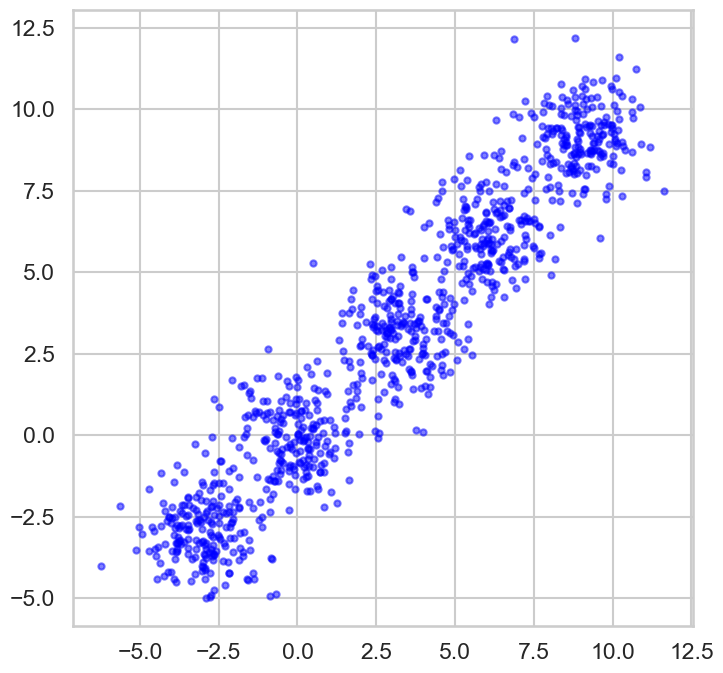

In [23]:
n_samples = 1000
n_bins = 4  
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9,9)]
Y, y = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Y)

#### 2.3. Example 3 : moons Data Gen and display 

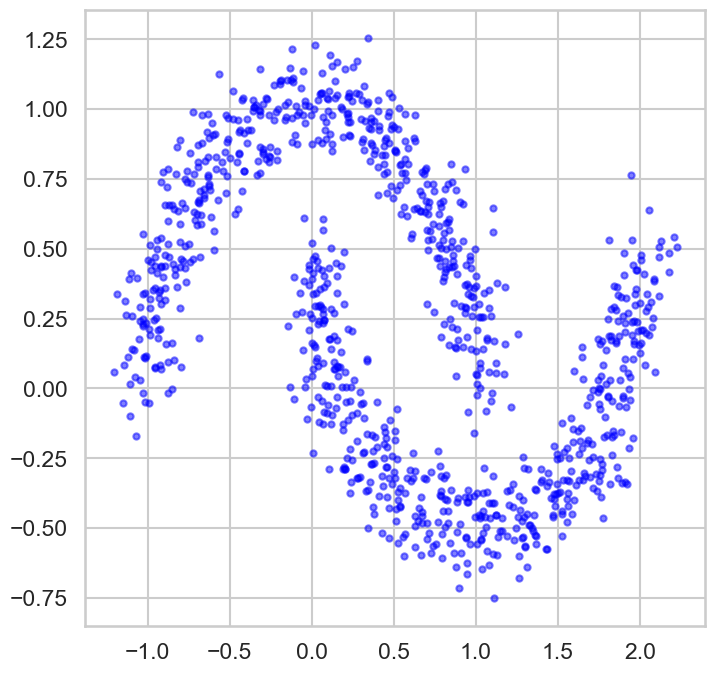

In [24]:
n_samples = 1000
Z, y = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
display_cluster(Z)

## 3. Testing the GUC_Kmean function on Simple 2D
1. Apply the GUC_Kmean fucntion to 2D Data provided by example 1, Example 2 and Example 3
2. Try a varing number of cluster centriods that range from 2 to 10 clusters on each set 
3. Display your results.
4. plot the Cluster perfromance Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

In [25]:
# def display_cluster(data_points, km=None, num_clusters=None, alpha=0.7, s=50):
#     color = plt.cm.rainbow(np.linspace(0, 1, num_clusters))
    
#     if km is not None:
#         for i in range(num_clusters):
        
#             cluster_points = data_points[km == i, :]
#             plt.scatter(cluster_points[:, 0], cluster_points[:, 1], c=[color[i]], alpha=alpha, s=s, label=f'Cluster {i}')
#             plt.scatter(np.mean(cluster_points[:, 0]), np.mean(cluster_points[:, 1]), c=color[i], marker='x', s=100, label=f'Centroid {i}')
#     else:
#         plt.scatter(data_points[:, 0], data_points[:, 1], c='b', alpha=alpha, s=s, label='Data Points')

#     plt.title('K-means Clustering Result')
#     plt.xlabel('Feature 1')
#     plt.ylabel('Feature 2')
#     plt.legend()
#     plt.show()
# # Apply K-means clustering
# num_clusters = 7
# distance_type = 'euclidean'
# final_cluster_distances, cluster_metric = GUC_Kmean(X, num_clusters, distance_type)

# # Find cluster labels based on the minimum distance
# cluster_labels = np.argmin(final_cluster_distances, axis=1)
# display_cluster(X, km=cluster_labels, num_clusters=num_clusters)


# # Display the clusters
# #display_cluster(X, km =cluster_labels, num_clusters=num_clusters)


Cluster_Centroids:
[[0.39418308 0.36669624]
 [0.29746282 0.01189706]
 [0.15980982 0.75523743]
 [0.41787921 0.82766715]
 [0.3020567  0.0673243 ]
 [0.7921496  0.05405785]
 [0.67044244 0.72656612]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


c:\anacon\envs\machine_learning\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\anacon\envs\machine_learning\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\hp\AppData\Local\Temp\ipykernel_9644\1407029526.py:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


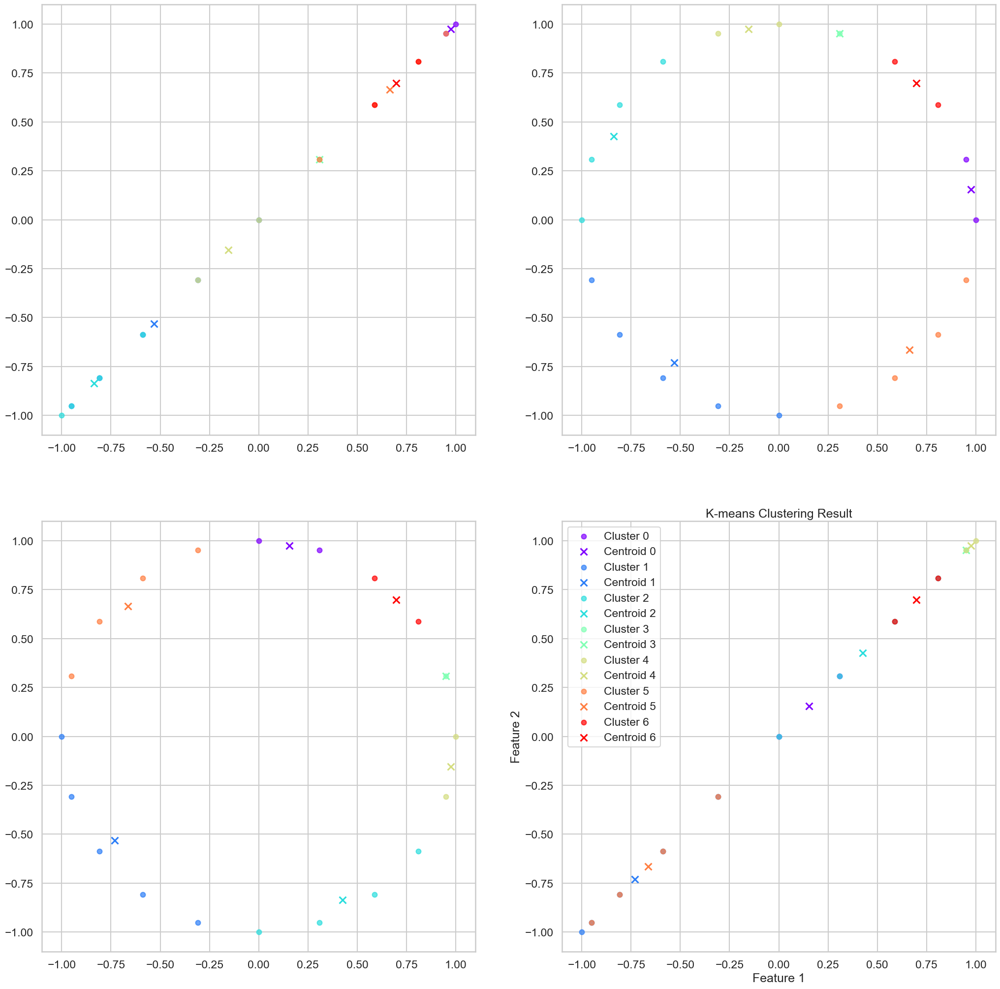

In [26]:
def display_cluster(data_points, km=None, num_clusters=None, alpha=0.7, s=50):
    color = plt.cm.rainbow(np.linspace(0, 1, num_clusters))
    vars = len(data_points[0])
    fig, axs = plt.subplots(vars,vars,figsize=(25, 25))
    if km is not None:
        for i in range(num_clusters):
            cluster_points = data_points[km == i, :]
            for j in range(0,len(cluster_points[0])):
                for k in range (0,len(cluster_points[0])):
                    cluster_points = data_points[km == i, :]
                    axs[j,k].scatter(cluster_points[:, j], cluster_points[:, k], c=[color[i]], alpha=alpha, s=s, label=f'Cluster {i}')
                    axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')
    else:
        plt.scatter(data_points[:, 0], data_points[:, 1], c='b', alpha=alpha, s=s, label='Data Points')

    plt.title('K-means Clustering Result')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()
# Apply K-means clustering
num_clusters = 7
distance_type = 'euclidean'
final_cluster_distances, cluster_metric = GUC_Kmean(X, num_clusters, distance_type)
# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)
display_cluster(X, km=cluster_labels, num_clusters=num_clusters)



Cluster_Centroids:
[[0.04220567 0.04698397]
 [0.16054424 0.05193426]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[0.63314834 0.08805597]
 [0.96656383 0.96851569]
 [0.55750914 0.6491929 ]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[0.06190127 0.27151456]
 [0.92068371 0.12406266]
 [0.59555078 0.04456202]
 [0.30185083 0.3959883 ]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[0.31366063 0.76996388]
 [0.32514385 0.9582477 ]
 [0.07323197 0.21930963]
 [0.86957542 0.59690137]
 [0.43532081 0.50909355]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[0.10689618 0.83870287]
 [0.90979384 0.59477077]
 [0.66811753 0.70981009]
 [0.43697964 0.42031813]
 [0.96

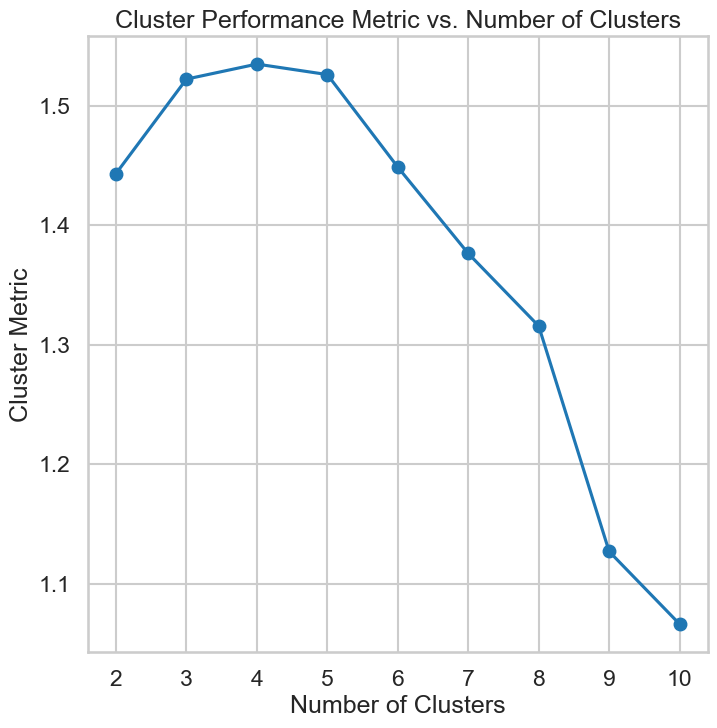

In [27]:
import matplotlib.pyplot as plt

def plot_cluster_metric_range(data_points, distance_type='euclidean', max_clusters=10):
    cluster_metrics = []

    for num_clusters in range(2, max_clusters + 1):
        _, cluster_metric = GUC_Kmean(data_points, num_clusters, distance_type)
        cluster_metrics.append(cluster_metric)

    # Plot the Cluster Performance Metric versus the Number of Clusters
    plt.plot(range(2, max_clusters + 1), cluster_metrics, marker='o')
    plt.title('Cluster Performance Metric vs. Number of Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Cluster Metric')
    plt.show()

# Assuming your data is in variable Y
plot_cluster_metric_range(X, distance_type='euclidean', max_clusters=10)



Cluster_Centroids:
[[0.22327709 0.3004746 ]
 [0.0072127  0.75674096]
 [0.14174399 0.38629639]
 [0.08921376 0.50363335]
 [0.12531773 0.97330896]
 [0.46588036 0.19819559]
 [0.49742984 0.03932758]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_9644\1859577092.py:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


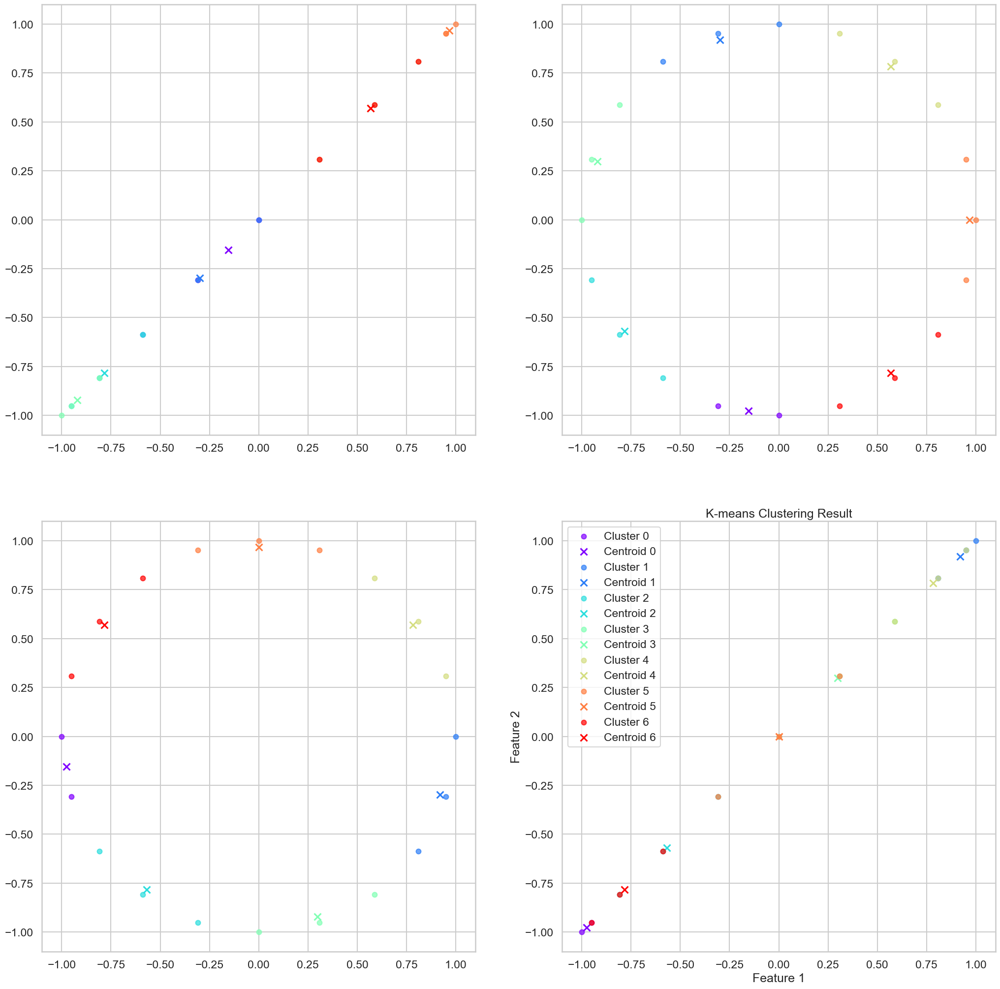

In [28]:
def display_cluster(data_points, km=None, num_clusters=None, alpha=0.7, s=50):
    color = plt.cm.rainbow(np.linspace(0, 1, num_clusters))
    vars = len(data_points[0])
    fig, axs = plt.subplots(vars,vars,figsize=(25, 25))
    if km is not None:
        for i in range(num_clusters):
            cluster_points = data_points[km == i, :]
            for j in range(0,len(cluster_points[0])):
                for k in range (0,len(cluster_points[0])):
                    cluster_points = data_points[km == i, :]
                    axs[j,k].scatter(cluster_points[:, j], cluster_points[:, k], c=[color[i]], alpha=alpha, s=s, label=f'Cluster {i}')
                    axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')
    else:
        plt.scatter(data_points[:, 0], data_points[:, 1], c='b', alpha=alpha, s=s, label='Data Points')

    plt.title('K-means Clustering Result')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()
# Apply K-means clustering
num_clusters = 7
distance_type = 'pearson'
final_cluster_distances, cluster_metric = GUC_Kmean(X, num_clusters, distance_type)
# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)
display_cluster(X, km=cluster_labels, num_clusters=num_clusters)



Cluster_Centroids:
[[ 0.72079967  3.3106062 ]
 [10.7207572   1.5127094 ]
 [ 6.93479781  0.54334947]
 [ 3.51485468  4.82832799]
 [ 3.65237212  9.38825247]
 [ 3.78608668 11.68401731]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\1407029526.py:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


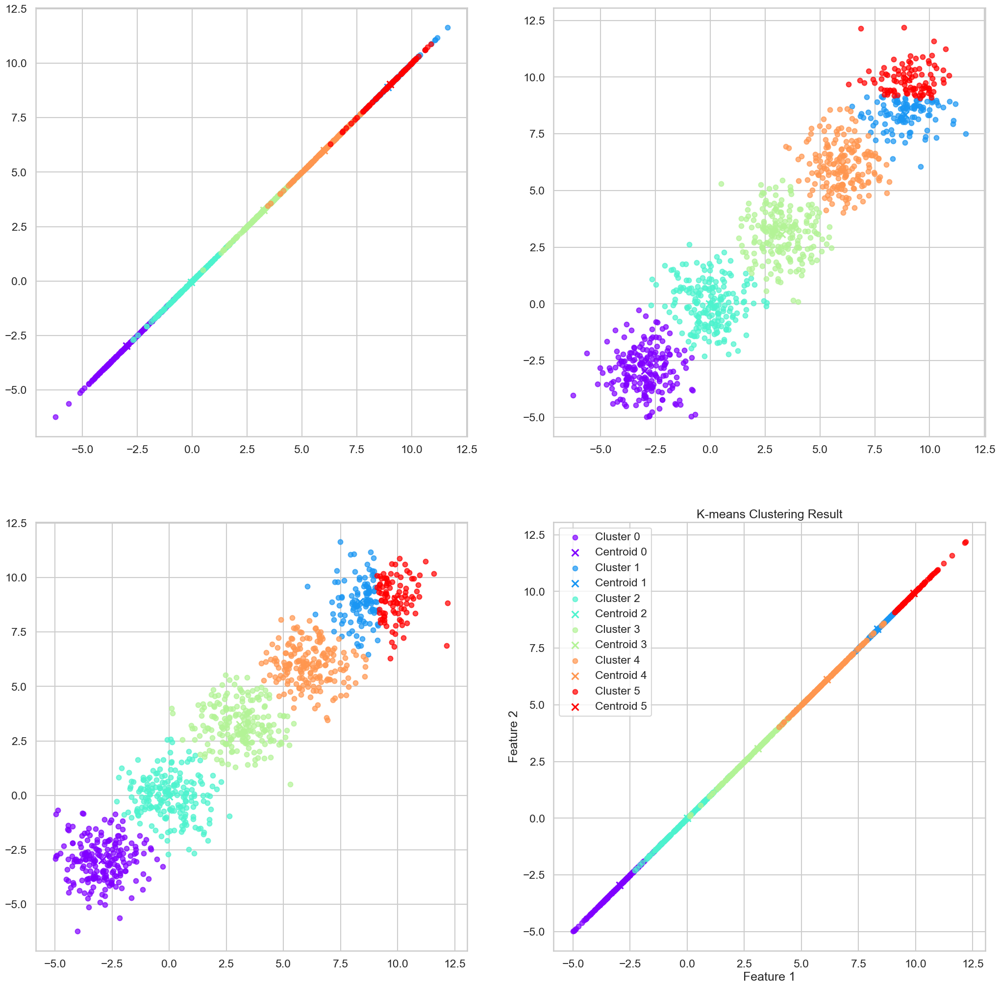

In [18]:
# Apply K-means clustering
num_clusters = 6
distance_type = 'euclidean'
final_cluster_distances, cluster_metric = GUC_Kmean(Y, num_clusters, distance_type)

# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)

# Display the clusters
display_cluster(Y, km =cluster_labels, num_clusters=num_clusters)



Cluster_Centroids:
[[ 0.49145731  0.57288055]
 [ 1.86943229  0.63324005]
 [ 7.37259662  1.07367586]
 [11.25500109 11.809216  ]
 [ 6.49182787  7.91567883]
 [ 2.75587101  8.56940198]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\1407029526.py:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


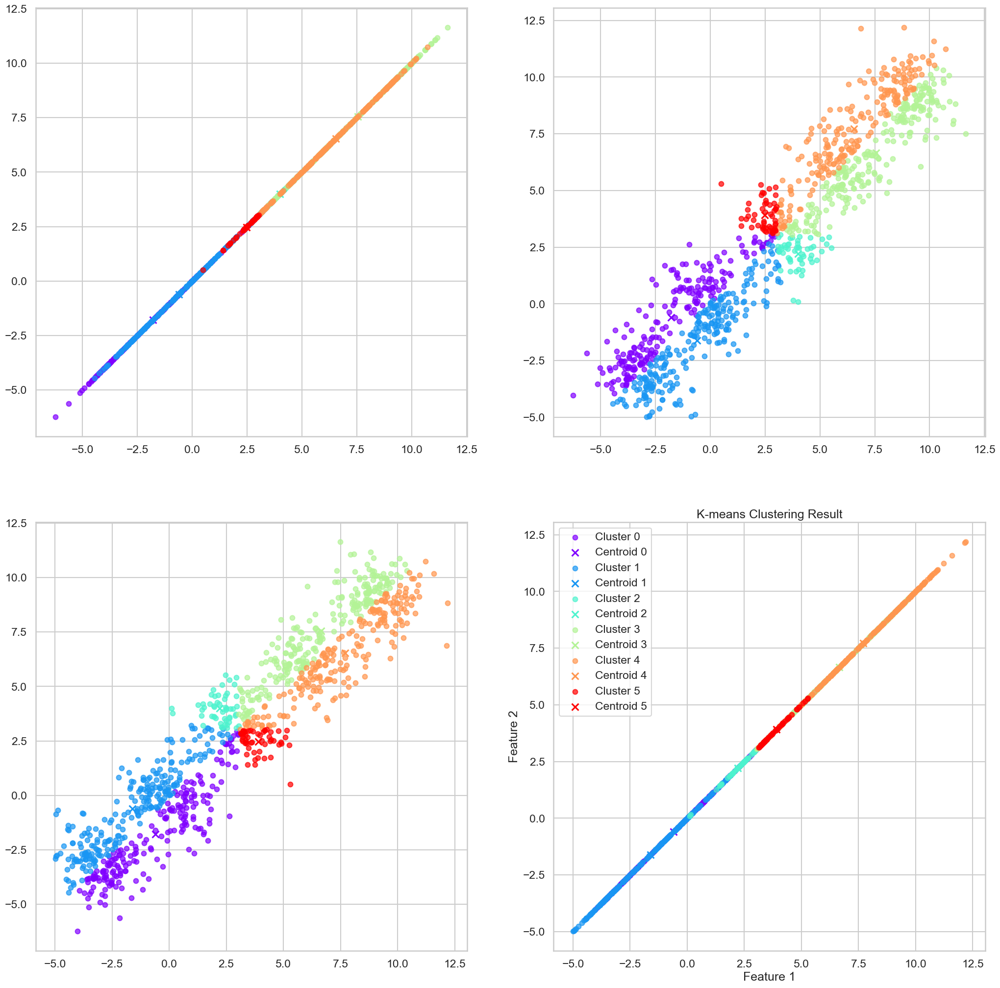

In [17]:
# Apply K-means clustering
num_clusters = 6
distance_type = 'pearson'
final_cluster_distances, cluster_metric = GUC_Kmean(Y, num_clusters, distance_type)

# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)

# Display the clusters
display_cluster(Y, km =cluster_labels, num_clusters=num_clusters)


Cluster_Centroids:
[[8.2325399  4.2891429 ]
 [7.05389759 7.22704789]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[4.54592852 3.69856386]
 [6.97492671 2.85542683]
 [6.82600239 0.39487931]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[ 2.90103876  6.49939334]
 [11.3354942   7.6797867 ]
 [ 2.16835741  7.52939358]
 [ 9.94114359  3.87926248]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[ 6.98905376  1.30710186]
 [ 8.16651978  9.18896662]
 [10.8310878   9.10073235]
 [ 9.64576098  7.62637716]
 [10.99203608 11.0784911 ]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[ 0.80495866  5.98817689]
 [ 8.77910879  4.61177216]
 [ 4.1243594   5.23658011]
 [ 9.47


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


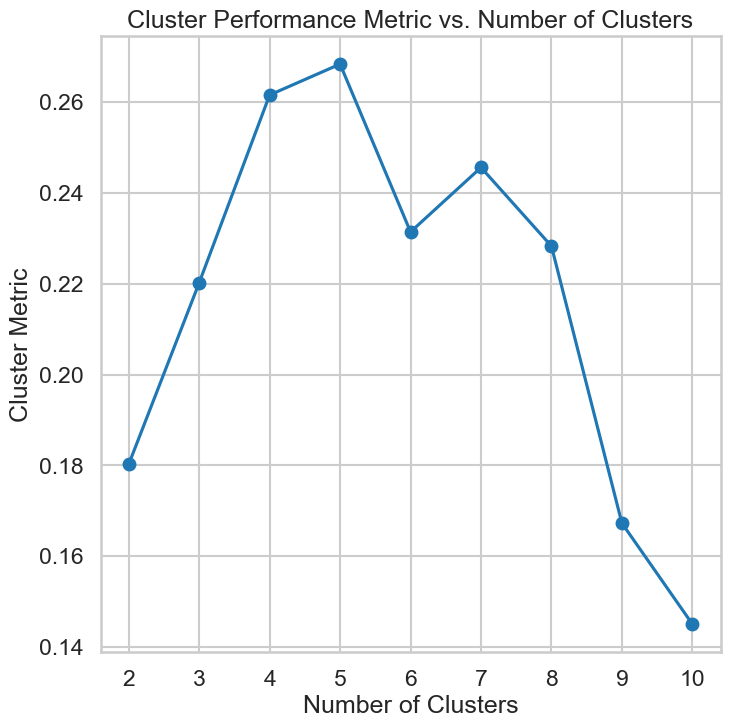

In [39]:
# Assuming your data is in variable Y
plot_cluster_metric_range(Y, distance_type='pearson', max_clusters=10)


Cluster_Centroids:
[[ 0.85273822  2.67406595]
 [10.12563471  7.27808256]
 [ 5.06902499  6.20743236]
 [11.31867192  0.51222766]
 [ 1.2447358  10.22639429]
 [10.59395183  7.25210404]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\1407029526.py:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


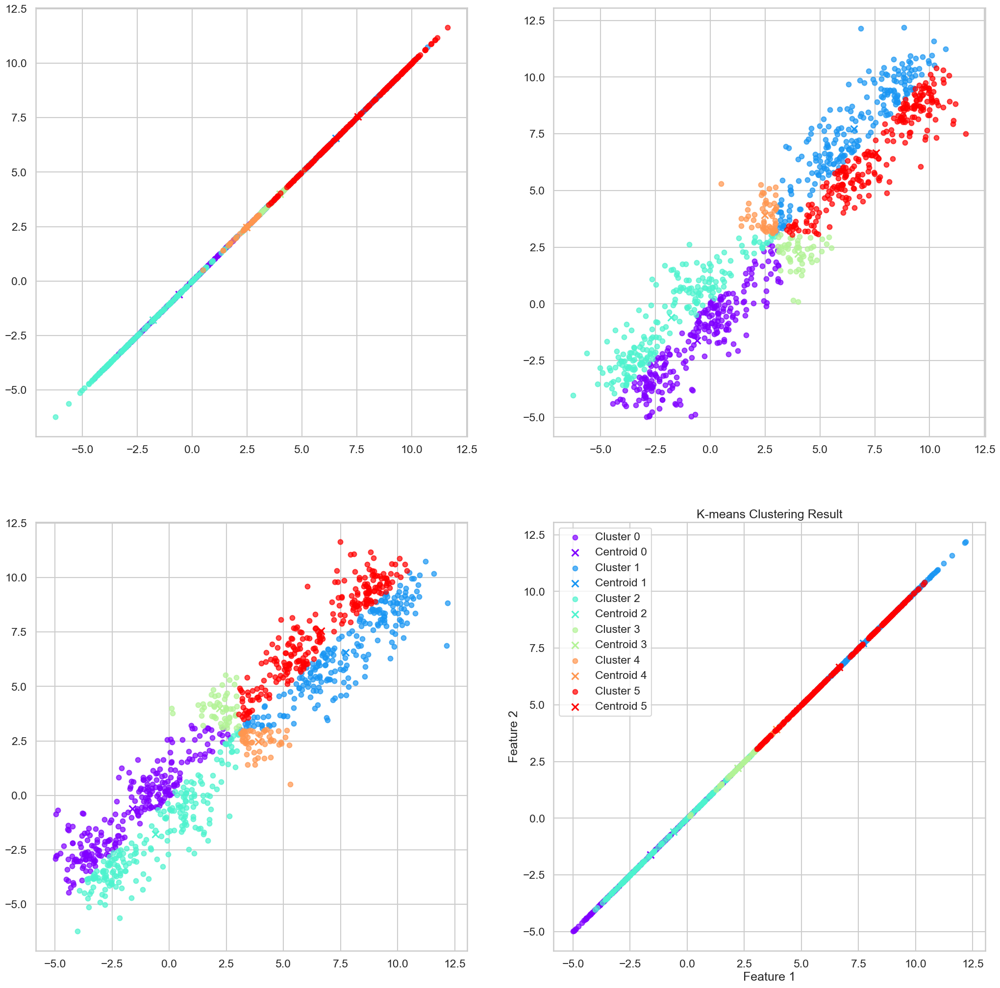

In [19]:
# Apply K-means clustering
num_clusters = 6
distance_type = 'pearson'
final_cluster_distances, cluster_metric = GUC_Kmean(Y, num_clusters, distance_type)

# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)

# Display the clusters
display_cluster(Y, km =cluster_labels, num_clusters=num_clusters)


Cluster_Centroids:
[[1.48803349 0.8912951 ]
 [0.97324244 0.52778553]
 [2.14060871 0.82739376]
 [1.85641453 1.23113169]
 [1.84175127 0.49321937]
 [2.01760683 0.74199832]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\1407029526.py:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


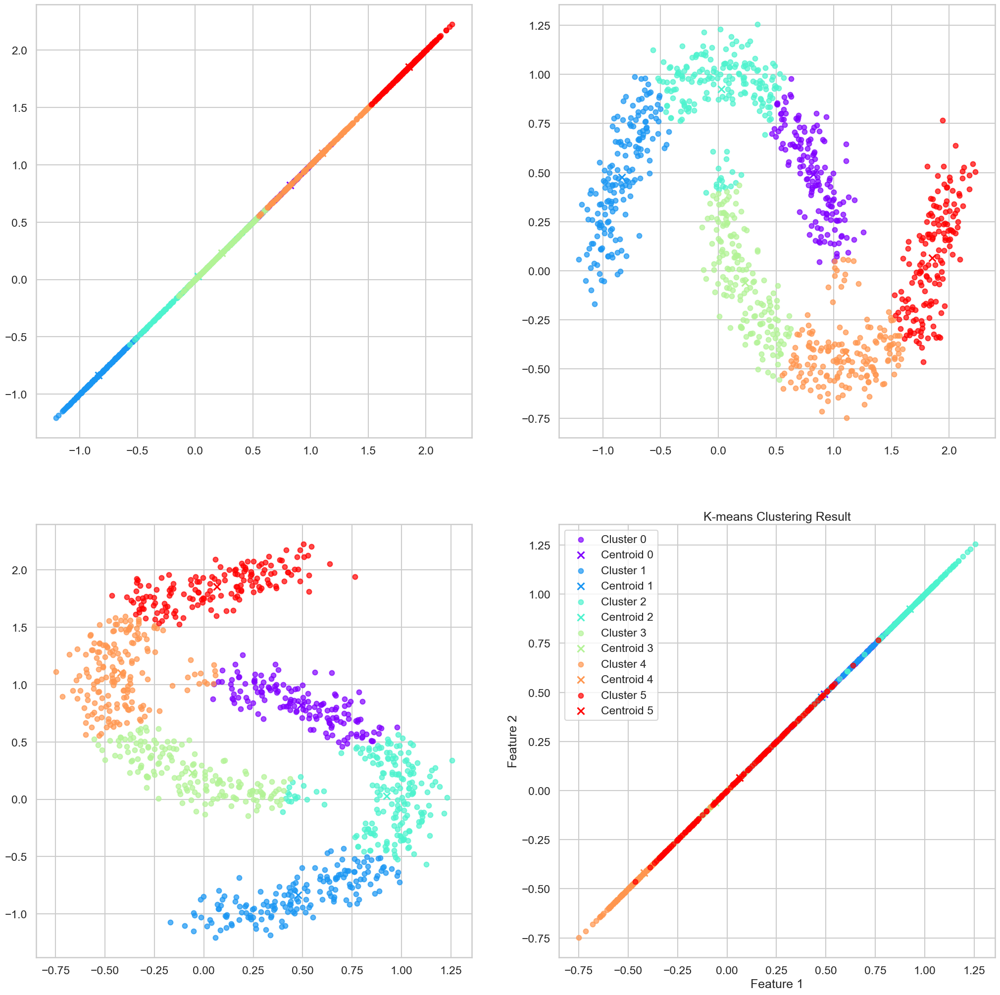

In [20]:
# Apply K-means clustering
num_clusters = 6
distance_type = 'euclidean'
final_cluster_distances, cluster_metric = GUC_Kmean(Z, num_clusters, distance_type)

# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)

# Display the clusters
display_cluster(Z, km =cluster_labels, num_clusters=num_clusters)


Cluster_Centroids:
[[1.01826603 1.21545746]
 [2.07365767 0.7319718 ]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[0.01510578 1.03715839]
 [2.08836226 0.36560908]
 [1.51845548 0.15852764]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[2.08690841 0.65838809]
 [1.19787121 0.77269948]
 [1.03981222 1.07893741]
 [2.02475371 0.65004917]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[0.92937866 0.32106928]
 [1.37102267 0.8334289 ]
 [1.53619548 1.06905131]
 [0.74480149 0.3901826 ]
 [1.08799905 1.07522401]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[1.57500303 0.5473049 ]
 [1.47889518 0.7175686 ]
 [1.96251803 0.56722613]
 [2.00546888 1.00424357]
 [1.75

c:\anacon\envs\machine_learning\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\anacon\envs\machine_learning\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)



Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[1.99950049 0.10262242]
 [2.15952512 0.13590796]
 [1.95322857 0.98194022]
 [0.236652   0.67327616]
 [0.06988948 0.07427926]
 [1.88233748 0.30219955]
 [0.29445724 0.20453035]
 [1.97891526 1.19776656]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[1.93642009 0.35281998]
 [1.56542823 1.00392747]
 [1.50014541 0.39525194]
 [0.9641333  0.53934809]
 [0.30163142 0.09237364]
 [2.10562768 1.0137895 ]
 [0.14644661 0.42981111]
 [0.72221676 0.90840829]
 [1.79223514 0.3255904 ]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[0.91477428 0.40103479]
 [1.49537982 0.84462031]
 [1.35298084 0.87500059]
 [0.53188883 0.81319065]
 [1.80193901 0.64187081]
 [2.20272362 0.06162178]
 [0.57052428 1.00225012]
 [0.8693

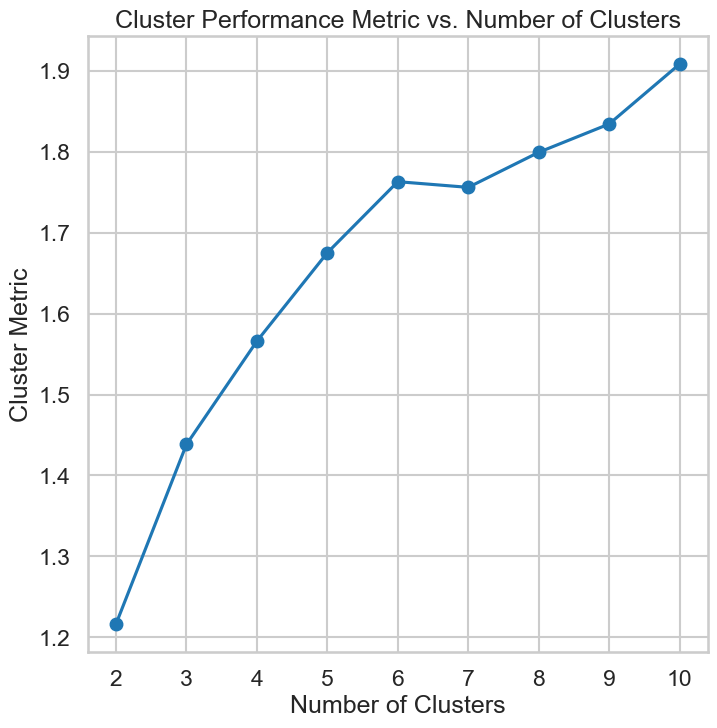

In [42]:
plot_cluster_metric_range(Z, distance_type='euclidean', max_clusters=10)


Cluster_Centroids:
[[1.42263754 0.58384397]
 [0.26137514 0.8816373 ]
 [1.08749344 0.76054976]
 [1.24420022 0.88263649]
 [1.53659942 0.02936844]
 [1.20796162 1.01892544]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\1407029526.py:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j,k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


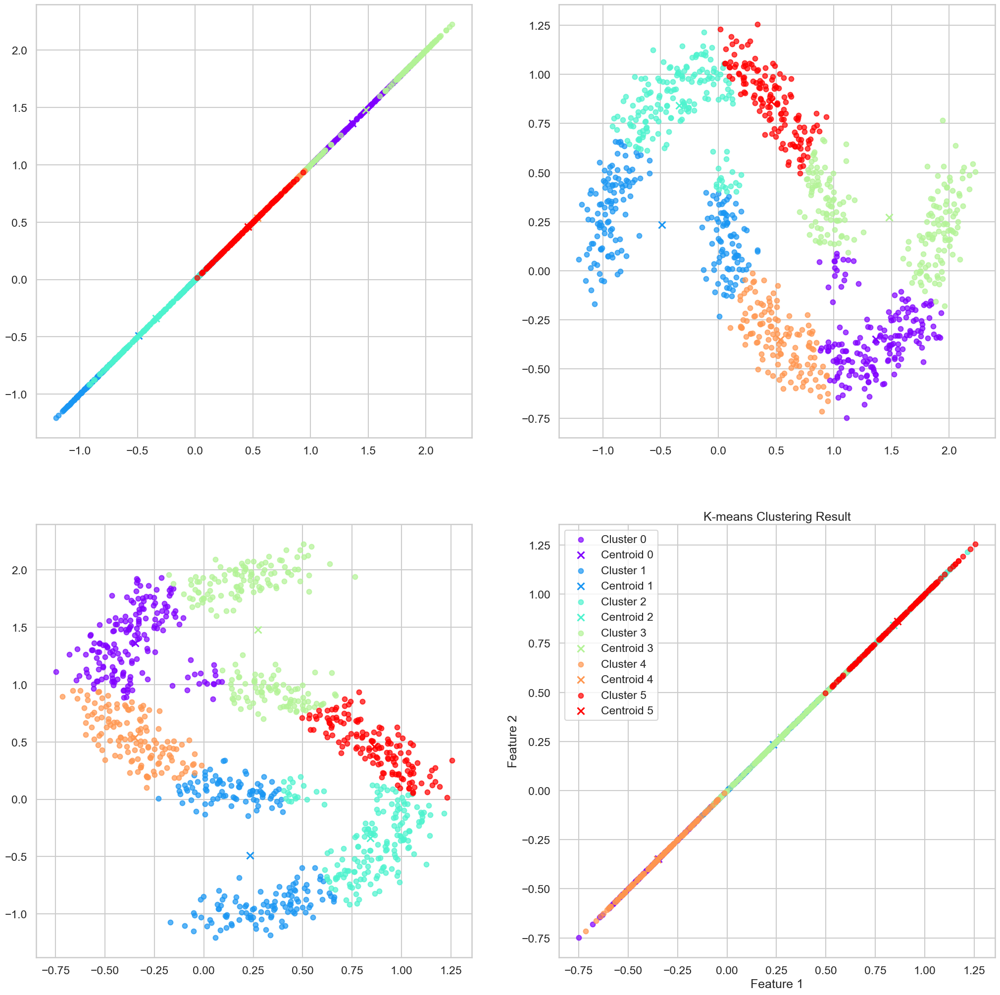

In [21]:
# Apply K-means clustering
num_clusters = 6
distance_type = 'pearson'
final_cluster_distances, cluster_metric = GUC_Kmean(Z, num_clusters, distance_type)

# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)

# Display the clusters
display_cluster(Z, km =cluster_labels, num_clusters=num_clusters)

## 4. Using the GUC_Kmean function to segment customers int he provided customer dataset
1. Apply the GUC_Kmean fucntion to customer data  
2. Try a varing number of cluster that range from 2 to 10 cluster on each set 
3. Display your results.
4. plot the Cluster Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

In [22]:
def display_cluster(data_points, km=None, num_clusters=None, alpha=0.7, s=50):
    color = plt.cm.rainbow(np.linspace(0, 1, num_clusters))
    vars = len(data_points[0])
    fig, axs = plt.subplots(vars, vars, figsize=(25, 25))
    if km is not None:
        for i in range(num_clusters):
            cluster_points = data_points[km == i, :]
            for j in range(vars):
                for k in range(vars):
                    axs[j, k].scatter(cluster_points[:, j], cluster_points[:, k], c=[color[i]], alpha=alpha, s=s, label=f'Cluster {i}')
                    axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')
    else:
        plt.scatter(data_points[:, 0], data_points[:, 1], c='b', alpha=alpha, s=s, label='Data Points')

    plt.title('K-means Clustering Result')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()


In [23]:
dataset = pd.read_csv('C:/Users/hp/Desktop/Semester 10/(NETW 1013) Machine Learning/Machine Learning Assignment 1/Customer data.csv')

In [24]:
dataset

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1
...,...,...,...,...,...,...,...,...
1995,100001996,1,0,47,1,123525,0,0
1996,100001997,1,1,27,1,117744,1,0
1997,100001998,0,0,31,0,86400,0,0
1998,100001999,1,1,24,1,97968,0,0


In [25]:
C= dataset.values


Cluster_Centroids:
[[8.17719685e+07 8.25305163e-01 8.69036681e-01 2.51002144e+00
  1.31047016e+00 2.57713132e+05 1.18428824e+00 1.49867576e+00]
 [8.60690483e+07 6.15342669e-02 6.85243825e-03 2.59588937e+01
  2.74787395e+00 7.70879788e+04 1.40275145e+00 1.12083730e+00]
 [6.65606354e+06 7.76053842e-01 4.93702126e-01 2.76419129e+01
  2.73547985e+00 1.21496141e+05 9.22968223e-01 1.08170431e+00]
 [6.10910055e+07 5.48047465e-01 1.61053684e-01 4.52437515e+01
  2.78684648e+00 2.77505750e+05 1.06773341e+00 3.32762960e-01]]


c:\anacon\envs\machine_learning\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\anacon\envs\machine_learning\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)



Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\1975022939.py:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


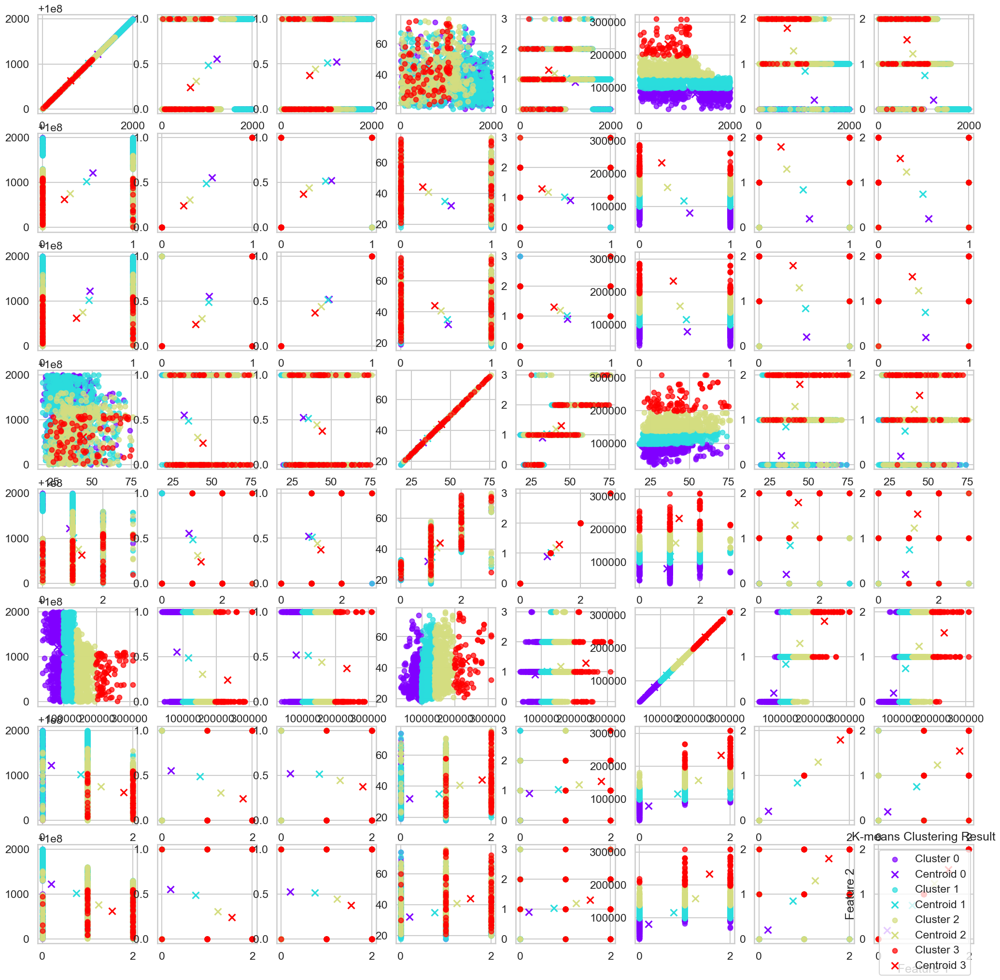

In [26]:
# Apply K-means clustering
num_clusters = 4
distance_type = 'euclidean'
final_cluster_distances, cluster_metric = GUC_Kmean(C, num_clusters, distance_type)
# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)
display_cluster(C, km=cluster_labels, num_clusters=num_clusters)

In [27]:
# num_clusters = 2
# distance_type = 'euclidean'
# final_cluster_distances, cluster_metric = GUC_Kmean(X, num_clusters, distance_type)

# # Find cluster labels based on the minimum distance
# cluster_labels = np.argmin(final_cluster_distances, axis=1)

# # Display the clusters
# display_cluster(C, km=cluster_labels, num_clusters=num_clusters)


Cluster_Centroids:
[[8.05181813e+05 2.78744111e-01 3.50701962e-01 3.92182679e+01
  3.50584283e-01 2.92157215e+05 4.25646848e-01 5.38811701e-01]
 [5.11594787e+06 7.92258573e-01 1.97113824e-01 3.18199424e+01
  5.90177845e-01 5.50363133e+04 9.06615764e-01 6.51627207e-01]
 [9.69230591e+07 7.96350909e-01 5.29217469e-01 2.36180466e+01
  1.39708848e+00 6.12567233e+04 1.17715752e+00 1.40184289e+00]
 [4.62200837e+07 8.39385849e-01 7.83181585e-01 2.83924043e+01
  2.95492675e+00 1.71412042e+05 2.88028909e-01 1.28640783e+00]
 [5.09516041e+07 9.09548362e-01 1.45621190e-01 4.25794445e+01
  2.62490646e+00 2.98466724e+05 2.57123484e-01 1.64979422e+00]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\1975022939.py:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


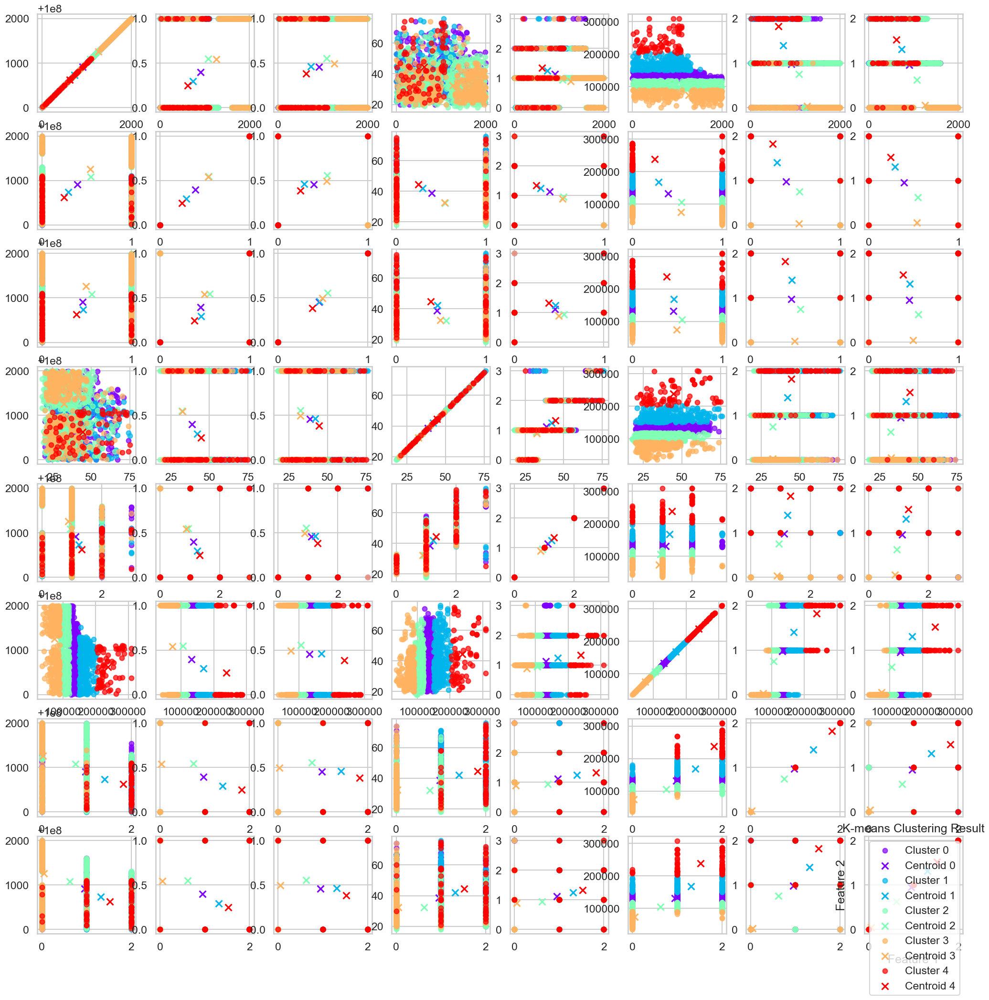

In [28]:
# Apply K-means clustering
num_clusters = 5
distance_type = 'euclidean'
final_cluster_distances, cluster_metric = GUC_Kmean(C, num_clusters, distance_type)
# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)
display_cluster(C, km=cluster_labels, num_clusters=num_clusters)

In [33]:
dataset.columns

Index(['ID', 'Sex', 'Marital status', 'Age', 'Education', 'Income',
       'Occupation', 'Settlement size'],
      dtype='object')

C:\Users\hp\AppData\Local\Temp\ipykernel_21428\2726082041.py:14: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


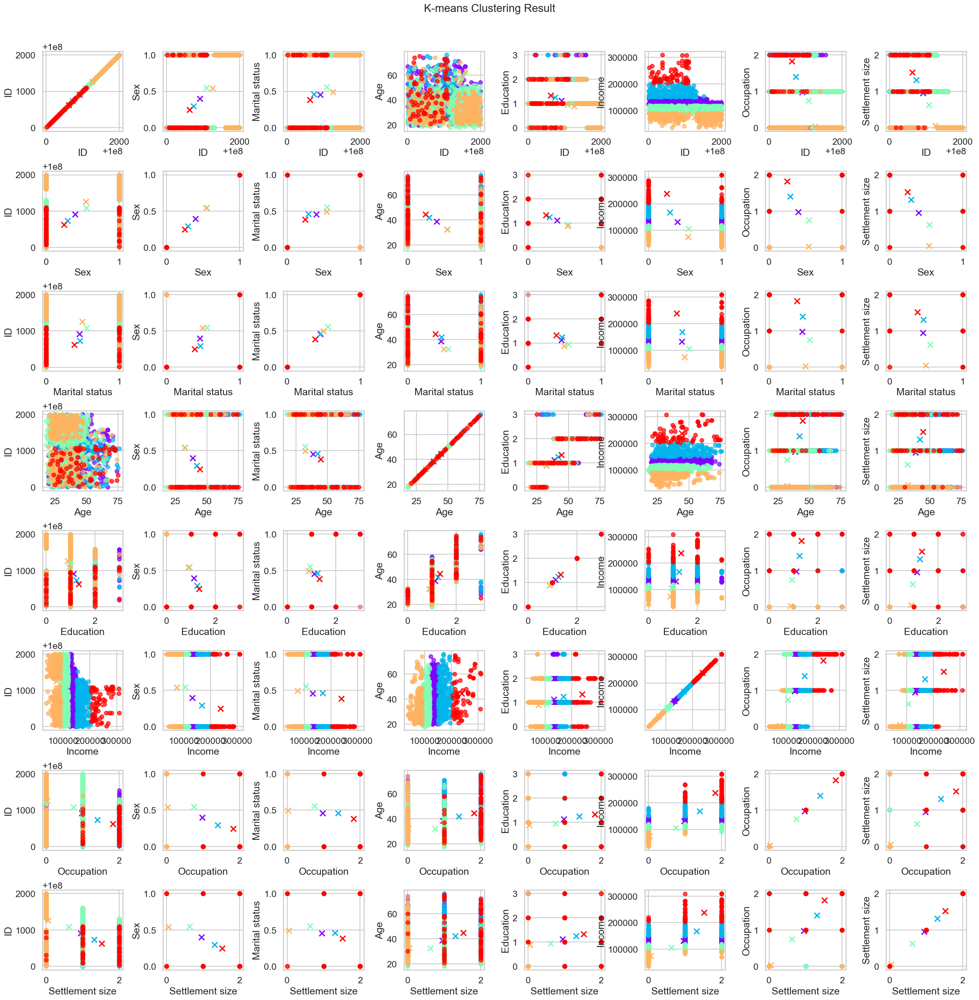

In [35]:
def display_cluster(data_points, feature_names=None, km=None, num_clusters=None, alpha=0.7, s=50):
    color = plt.cm.rainbow(np.linspace(0, 1, num_clusters))
    num_features = len(data_points[0])
    fig, axs = plt.subplots(num_features, num_features, figsize=(30, 30))
    
    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # Add more spacing between subplots
    
    if km is not None:
        for i in range(num_clusters):
            cluster_points = data_points[km == i, :]
            for j in range(num_features):
                for k in range(num_features):
                    axs[j, k].scatter(cluster_points[:, j], cluster_points[:, k], c=[color[i]], alpha=alpha, s=s, label=f'Cluster {i}')
                    axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')
                    axs[j, k].set_xlabel(feature_names[j])  # Set x-axis label
                    axs[j, k].set_ylabel(feature_names[k])  # Set y-axis label
    else:
        plt.scatter(data_points[:, 0], data_points[:, 1], c='b', alpha=alpha, s=s, label='Data Points')

    plt.suptitle('K-means Clustering Result', y=0.92, fontsize=20)
    plt.show()

# Assuming you have feature names for your columns, you can pass them to the function
feature_names = ["ID", "Sex", "Marital status", "Age", "Education", "Income",
       "Occupation", "Settlement size"]  # Replace with your actual feature names
display_cluster(C, feature_names=feature_names, km=cluster_labels, num_clusters=num_clusters)



Cluster_Centroids:
[[9.91537900e+07 9.52911242e-01 7.18351988e-01 3.60815023e+01
  2.39944230e+00 1.56354667e+05 1.51575305e+00 1.33500868e+00]
 [4.94789860e+07 9.69516318e-01 5.69382126e-01 7.44599222e+01
  1.51260989e+00 1.10315355e+05 5.44083139e-01 8.92611434e-01]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\1837609429.py:18: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')



Cluster_Centroids:
[[2.65624313e+05 1.85862198e-01 1.91574469e-01 1.92186767e+01
  1.47801097e+00 2.82495614e+05 1.61127924e+00 8.06599931e-01]
 [5.78593874e+07 7.71957476e-01 9.44651574e-02 1.19348476e+01
  2.48673548e+00 1.26748402e+05 1.14641540e+00 6.54927957e-01]
 [7.29202518e+07 3.10236636e-01 4.74480775e-01 1.63435641e+01
  1.21525023e+00 9.11729189e+04 1.10257595e+00 3.82934479e-01]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[7.42718141e+07 5.18933965e-02 7.32975692e-01 1.91941800e+01
  1.94004049e+00 2.21263067e+04 1.04385905e+00 4.33497406e-01]
 [9.35413791e+07 9.21397209e-01 4.88660942e-01 1.75639270e+01
  6.85382357e-01 1.05680113e+05 4.42177449e-01 6.12239765e-01]
 [2.69118406e+07 6.88717196e-01 8.67041637e-01 5.28501646e+01
  2.26596460e+00 5.78112813e+03 1.76908679e-01 1.70305914e+00]
 [4.47003721e+07 2.31813747e-01 7.50206105e-01 3.36704176e+01
  1.82116620e+00 1.62405033e+05 1.569

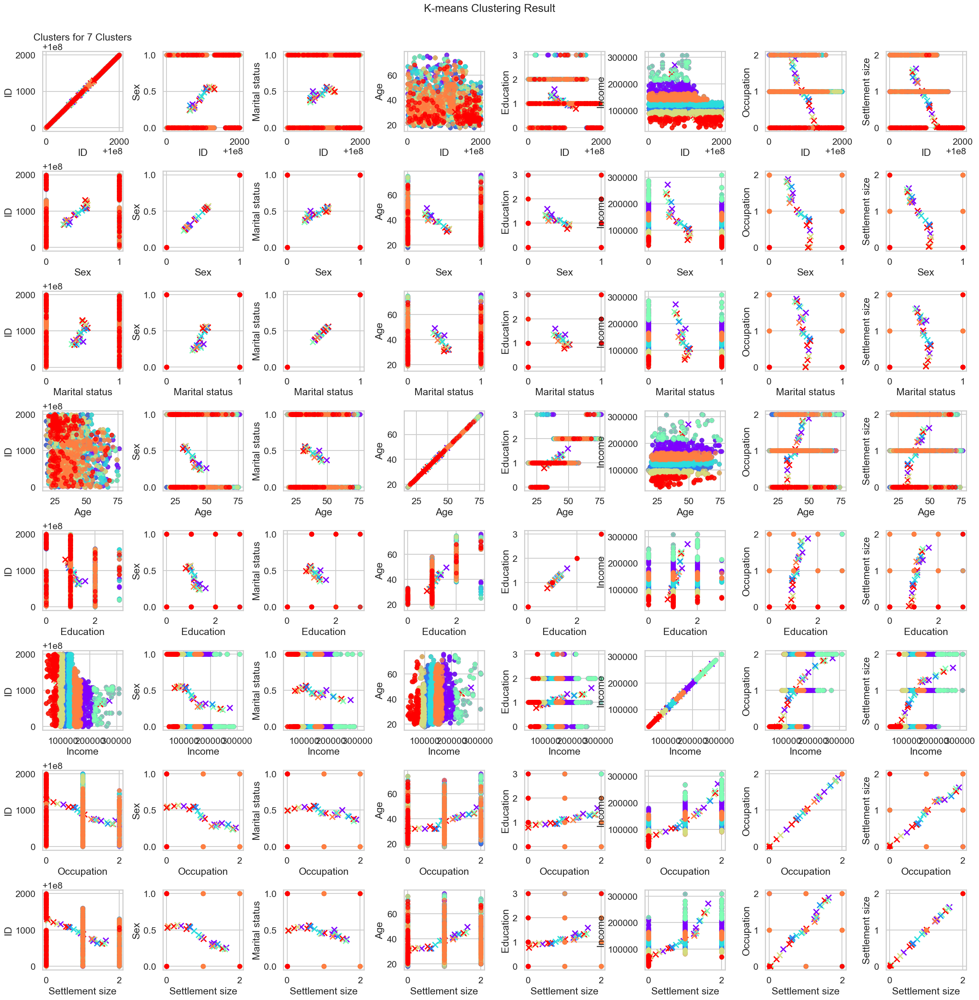

In [45]:
def display_cluster_metric_range(data_points, feature_names=None, distance_type='euclidean', max_clusters=10, alpha=0.7, s=50):
    num_features = len(data_points[0])
    fig, axs = plt.subplots(num_features, num_features, figsize=(30, 30))
    
    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # Add more spacing between subplots
    
    for num_clusters in range(2, max_clusters + 1):
        final_cluster_distances, cluster_metric = GUC_Kmean(data_points, num_clusters, distance_type)
        cluster_labels = np.argmin(final_cluster_distances, axis=1)
        
        color = plt.cm.rainbow(np.linspace(0, 1, num_clusters))
        
        for i in range(num_clusters):
            cluster_points = data_points[cluster_labels == i, :]
            for j in range(num_features):
                for k in range(num_features):
                    axs[j, k].scatter(cluster_points[:, j], cluster_points[:, k], c=[color[i]], alpha=alpha, s=s, label=f'Cluster {i}')
                    axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')
                    axs[j, k].set_xlabel(feature_names[j])  # Set x-axis label
                    axs[j, k].set_ylabel(feature_names[k])  # Set y-axis label
    
        axs[0, 0].set_title(f'Clusters for {num_clusters} Clusters', fontsize=18)
    
    plt.suptitle('K-means Clustering Result', y=0.92, fontsize=20)
    plt.show()

# Assuming you have feature names for your columns, you can pass them to the function
feature_names = ["ID", "Sex", "Marital status", "Age", "Education", "Income", "Occupation", "Settlement size"]  # Replace with your actual feature names

# Visualize clusters for a range of cluster numbers
display_cluster_metric_range(C, feature_names=feature_names, distance_type='euclidean', max_clusters=7)



Cluster_Centroids:
[[2.84512168e+07 5.92424306e-01 8.66074664e-01 2.61495447e+01
  1.83363254e+00 1.97734178e+05 1.61961372e+00 1.11420187e+00]
 [7.21526604e+07 9.90887873e-01 3.83716263e-01 3.77099111e+01
  1.47207882e-01 2.85249316e+05 6.40965680e-01 4.13427100e-01]
 [4.70858309e+07 8.99667747e-01 4.68134589e-01 6.68467980e+01
  2.59799310e+00 2.60522517e+05 1.76571133e+00 8.36280518e-01]
 [6.10906196e+07 9.82422561e-02 7.41084356e-01 3.48566113e+01
  1.08697641e+00 1.56453356e+05 1.68449371e+00 1.61131569e+00]
 [8.25615394e+07 7.00250283e-01 3.27787802e-01 2.82711274e+01
  6.60112137e-01 2.03126614e+05 1.56940330e+00 1.97758944e+00]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\2855604900.py:14: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')


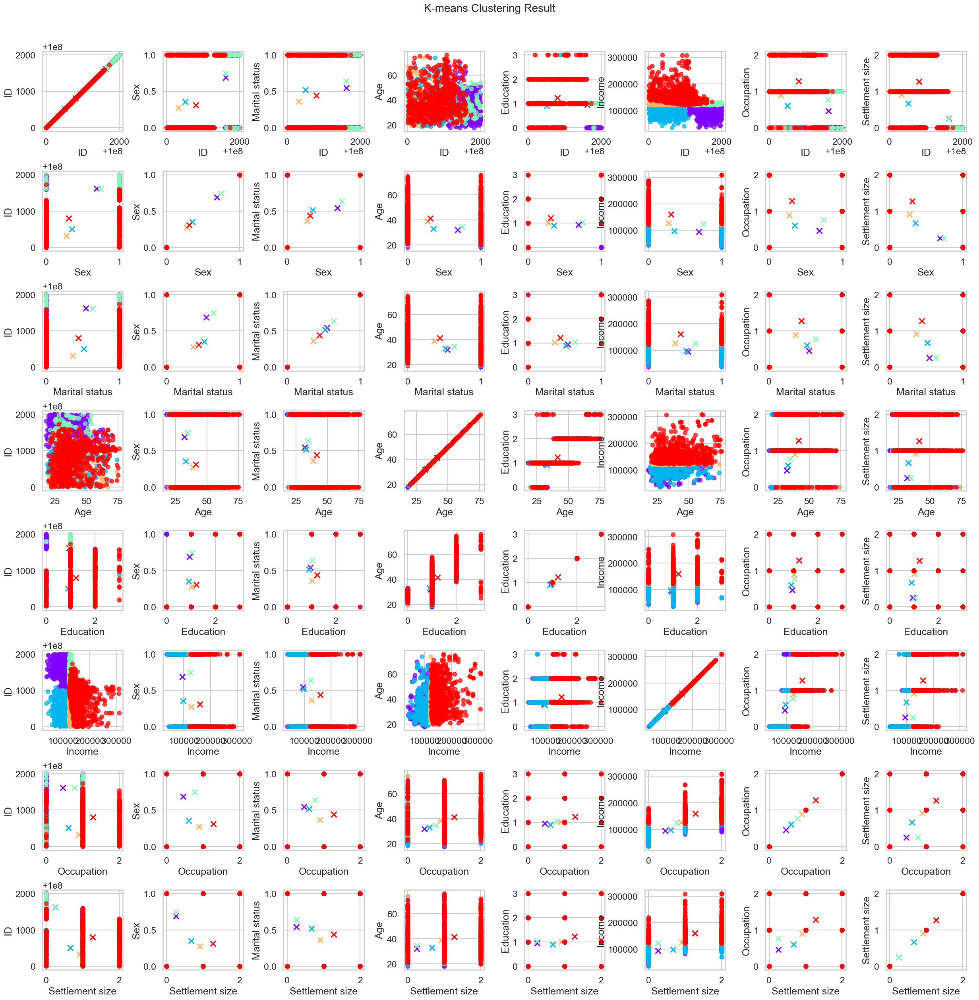

In [43]:
def display_cluster(data_points, feature_names=None, km=None, num_clusters=None, alpha=0.7, s=50):
    color = plt.cm.rainbow(np.linspace(0, 1, num_clusters))
    num_features = len(data_points[0])
    fig, axs = plt.subplots(num_features, num_features, figsize=(30, 30))
    
    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # Add more spacing between subplots
    
    if km is not None:
        for i in range(num_clusters):
            cluster_points = data_points[km == i, :]
            for j in range(num_features):
                for k in range(num_features):
                    axs[j, k].scatter(cluster_points[:, j], cluster_points[:, k], c=[color[i]], alpha=alpha, s=s, label=f'Cluster {i}')
                    axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')
                    axs[j, k].set_xlabel(feature_names[j])  # Set x-axis label
                    axs[j, k].set_ylabel(feature_names[k])  # Set y-axis label
    else:
        plt.scatter(data_points[:, 0], data_points[:, 1], c='b', alpha=alpha, s=s, label='Data Points')

    plt.suptitle('K-means Clustering Result', y=0.92, fontsize=20)
    plt.show()

# Assuming you have feature names for your columns, you can pass them to the function
feature_names = ["ID", "Sex", "Marital status", "Age", "Education", "Income",
       "Occupation", "Settlement size"]  # Replace with your actual feature names

num_clusters = 5
distance_type = 'pearson'
final_cluster_distances, cluster_metric = GUC_Kmean(C, num_clusters, distance_type)
# Find cluster labels based on the minimum distance
cluster_labels = np.argmin(final_cluster_distances, axis=1)
display_cluster(C, feature_names=feature_names, km=cluster_labels, num_clusters=num_clusters)


Cluster_Centroids:
[[3.76426356e+07 5.01736839e-01 4.45602755e-01 9.21741311e+00
  1.39053462e+00 1.56347136e+05 3.86094431e-01 1.64340640e+00]
 [5.64949973e+06 4.24270997e-01 2.66265057e-01 6.15365041e+01
  4.17733181e-01 1.39289789e+05 1.76159320e+00 3.34891239e-01]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


C:\Users\hp\AppData\Local\Temp\ipykernel_21428\1061836282.py:18: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')



Cluster_Centroids:
[[4.32906060e+07 1.98381218e-02 2.98344070e-01 4.80652785e+01
  2.87284067e+00 1.22804851e+05 1.40587099e+00 1.08852753e+00]
 [3.53000464e+07 4.87502917e-01 7.09860382e-01 5.82999631e+01
  1.55019280e+00 2.36126746e+05 1.94175258e+00 2.93671093e-01]
 [5.39006762e+06 4.77112350e-02 6.70593379e-01 2.26634023e+01
  1.90160053e+00 2.77672878e+05 5.67109337e-01 1.95167234e+00]]

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Cluster_Centroids:
[[7.19482277e+07 8.93906225e-01 2.38609444e-01 1.69456940e+01
  1.67294668e+00 2.48781437e+05 1.29744048e+00 1.39072601e+00]
 [1.85179831e+06 8.30513178e-01 4.68254531e-01 5.47148453e+01
  2.10882816e+00 2.31125110e+05 1.26101983e+00 9.39820561e-02]
 [6.92860502e+07 3.28431911e-01 7.37644339e-01 4.21684827e-01
  1.06043183e-01 1.30109288e+05 6.41667130e-01 6.37100626e-01]
 [1.81682389e+07 2.00112783e-01 3.37981030e-01 5.07067372e-02
  2.72883972e+00 4.71022817e+04 7.719

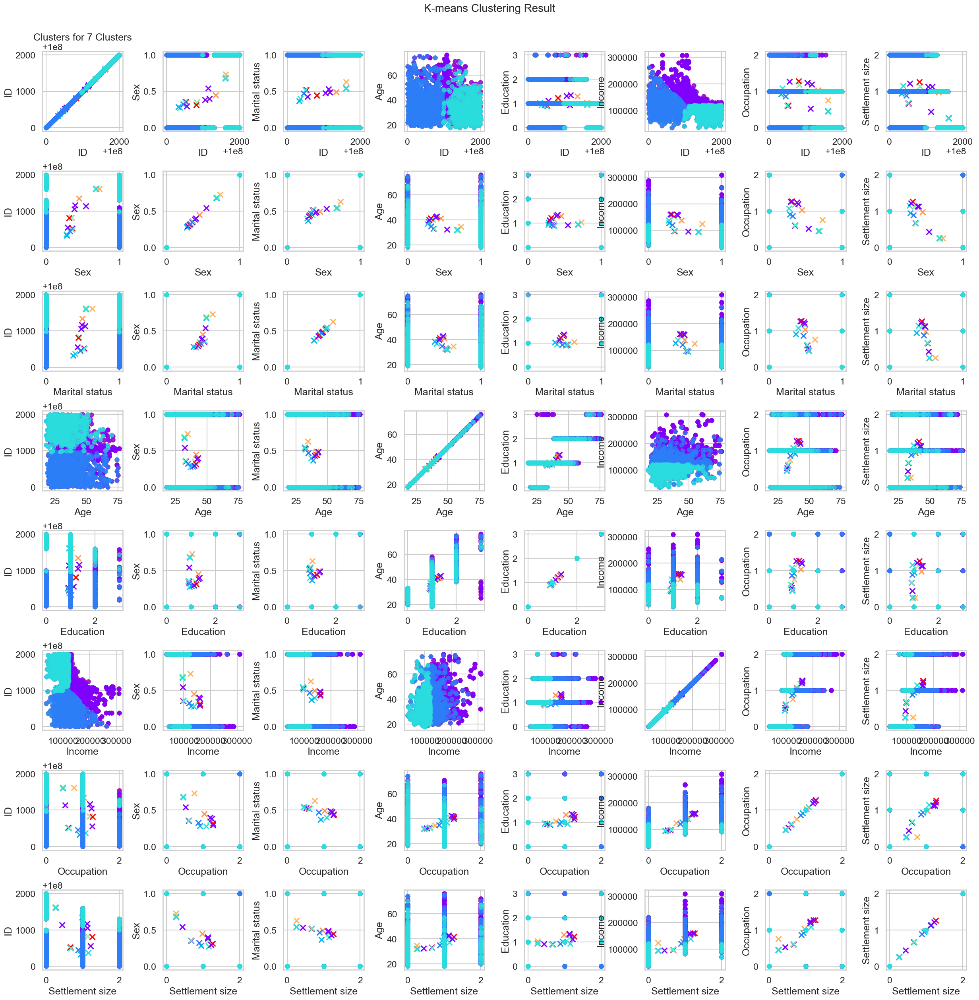

In [44]:
def display_cluster_metric_range(data_points, feature_names=None, distance_type='euclidean', max_clusters=10, alpha=0.7, s=50):
    num_features = len(data_points[0])
    fig, axs = plt.subplots(num_features, num_features, figsize=(30, 30))
    
    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # Add more spacing between subplots
    
    for num_clusters in range(2, max_clusters + 1):
        final_cluster_distances, cluster_metric = GUC_Kmean(data_points, num_clusters, distance_type)
        cluster_labels = np.argmin(final_cluster_distances, axis=1)
        
        color = plt.cm.rainbow(np.linspace(0, 1, num_clusters))
        
        for i in range(num_clusters):
            cluster_points = data_points[cluster_labels == i, :]
            for j in range(num_features):
                for k in range(num_features):
                    axs[j, k].scatter(cluster_points[:, j], cluster_points[:, k], c=[color[i]], alpha=alpha, s=s, label=f'Cluster {i}')
                    axs[j, k].scatter(np.mean(cluster_points[:, j]), np.mean(cluster_points[:, k]), c=color[i], marker='x', s=100, label=f'Centroid {i}')
                    axs[j, k].set_xlabel(feature_names[j])  # Set x-axis label
                    axs[j, k].set_ylabel(feature_names[k])  # Set y-axis label
    
        axs[0, 0].set_title(f'Clusters for {num_clusters} Clusters', fontsize=18)
    
    plt.suptitle('K-means Clustering Result', y=0.92, fontsize=20)
    plt.show()

# Assuming you have feature names for your columns, you can pass them to the function
feature_names = ["ID", "Sex", "Marital status", "Age", "Education", "Income", "Occupation", "Settlement size"]  # Replace with your actual feature names

# Visualize clusters for a range of cluster numbers
display_cluster_metric_range(C, feature_names=feature_names, distance_type='pearson', max_clusters=7)
